# Antarctic ice shelf gravity and constraint proximity calculations

## Estimating the strength of the regional field

In [2]:
%load_ext autoreload
%autoreload 2
import logging
import os

import geopandas as gpd
import numpy as np
import pandas as pd
import pygmt
import scipy as sp
import verde as vd
import xarray as xr
from polartoolkit import fetch, maps, regions
from polartoolkit import utils as polar_utils

os.environ["POLARTOOLKIT_HEMISPHERE"] = "south"

import seaborn as sns
from invert4geom import utils

from synthetic_bathymetry_inversion import ice_shelf_stats

sns.set_theme()

In [2]:
logging.basicConfig(level=logging.WARN)
# logging.getLogger("synthetic_bathymetry_inversion").setLevel(logging.DEBUG)

### Ice shelf masks
Here we gather regional masks for some of the major Antarctic ice shelves. We will use bedmachine 

In [3]:
ice_shelves = ice_shelf_stats.get_ice_shelves()
ice_shelves

,NAME,Regions,TYPE,geometry,area_km
0,Ross,West,FL,"POLYGON ((-240677.184 -678259.006, -240038.274...",480428.37
1,Ronne_Filchner,West,FL,"POLYGON ((-1006734.891 880592.98, -1006335.923...",427041.70
2,Amery,East,FL,"POLYGON ((2134701.422 618463.117, 2131452.011 ...",60797.28
3,LarsenC,Peninsula,FL,"POLYGON ((-2235724.269 1271352.188, -2235828.5...",47443.51
4,Riiser-Larsen,East,FL,"POLYGON ((-592166.317 1592824.258, -593783.16 ...",42913.14
...,...,...,...,...,...
159,Perkins,West,FL,"POLYGON ((-1129608.753 -1201300.734, -1130034....",7.01
160,Paternostro,East,FL,"POLYGON ((824294.485 -2115301.607, 823916.673 ...",6.55
161,Arneb,East,FL,"POLYGON ((333867.825 -1897953.452, 333673.461 ...",6.41
162,Falkner,East,FL,"POLYGON ((425350.532 -1726631.609, 423726.753 ...",5.69


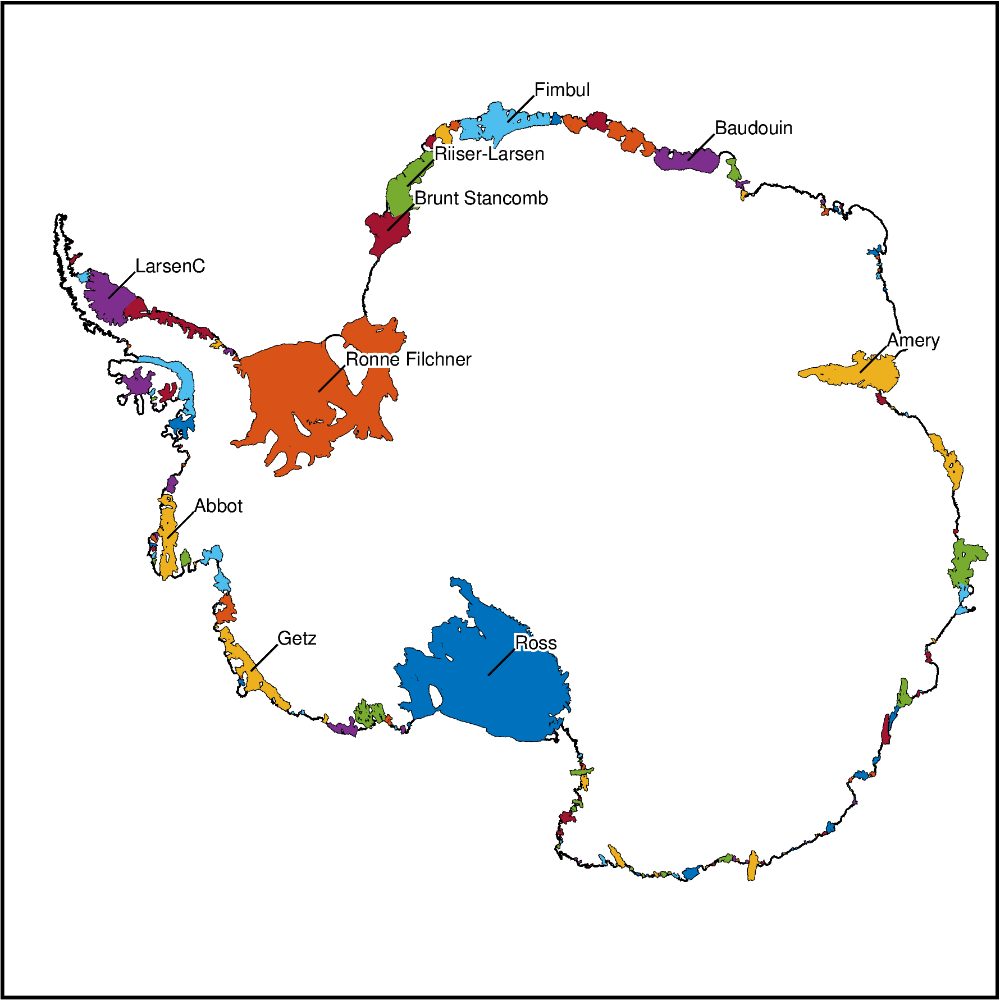

In [4]:
# choose how many ice shelves to plot
df = ice_shelves.iloc[:]

# plot basemap with coastline and grounding lines
fig = maps.basemap(
    region=regions.antarctica,
    coast=True,
)

# plot ice shelves
fig.plot(
    df,
    close=True,
    fill="auto",
)

# plot names
ice_shelf_stats.plot_ice_shelf_names(fig, df.iloc[0:10])

fig.show()

In [5]:
ice_shelves.NAME.unique()

array(['Ross', 'Ronne_Filchner', 'Amery', 'LarsenC', 'Riiser-Larsen',
       'Fimbul', 'Brunt_Stancomb', 'Getz', 'Baudouin', 'Abbot',
       'Shackleton', 'George_VI', 'LarsenD', 'Borchgrevink', 'West',
       'Wilkins', 'Sulzberger', 'Jelbart', 'Lazarev', 'Stange', 'Nivl',
       'Ekstrom', 'Nickerson', 'Totten', 'Pine_Island',
       'Moscow_University', 'Dotson', 'Mertz', 'Prince_Harald',
       'Thwaites', 'Bach', 'Cook', 'Crosson', 'Rennick', 'Venable',
       'Cosgrove', 'Tracy_Tremenchus', 'Mariner', 'Holmes', 'Drygalski',
       'LarsenB', 'Quar', 'Vigrid', 'Atka', 'Nansen', 'Ninnis',
       'Conger_Glenzer', 'Publications', 'Dibble', 'LarsenE',
       'Vincennes_Bay', 'WilmaRobertDowner', 'Swinburne', 'Shirase',
       'LarsenF', 'Aviator', 'Lillie', 'LarsenA', 'Voyeykov',
       'Rayner_Thyer', 'Land', 'Withrow', 'Lauritzen', 'Mendelssohn',
       'Tucker', 'Edward_VIII', 'LarsenG', 'Hannan', 'Fitzgerald',
       'Mulebreen', 'Helen', 'Wordie', 'Slava', 'Williamson', 'Zubchat

## Constraints and median distance

### create files for each ice shelves: `csv` for constraints and `netcdf` for min distances

#### for an individual shelf

/home/sungw937/synthetic_bathymetry_inversion/.pixi/envs/default/lib/python3.12/site-packages/geopandas/array.py:1755: UserWarning:

CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / Antarctic Polar Stereographic (the single non-null crs provided).

/home/sungw937/synthetic_bathymetry_inversion/.pixi/envs/default/lib/python3.12/site-packages/pygmt/clib/session.py:667: RuntimeWarning:

The definition of geographic CRS EPSG:4326 got from GeoTIFF keys is not the same as the one from the EPSG registry, which may cause issues during reprojection operations. Set GTIFF_SRS_SOURCE configuration option to EPSG to use official parameters (overriding the ones from GeoTIFF keys), or to GEOKEYS to use custom values from GeoTIFF keys and drop the EPSG code.

/home/sungw937/synthetic_bathymetry_inversion/.pixi/envs/default/lib/python3.12/site-packages/pyogrio/geopandas.py:710: UserWarning:

'crs' was not provided.  The output dataset will not have projection informati

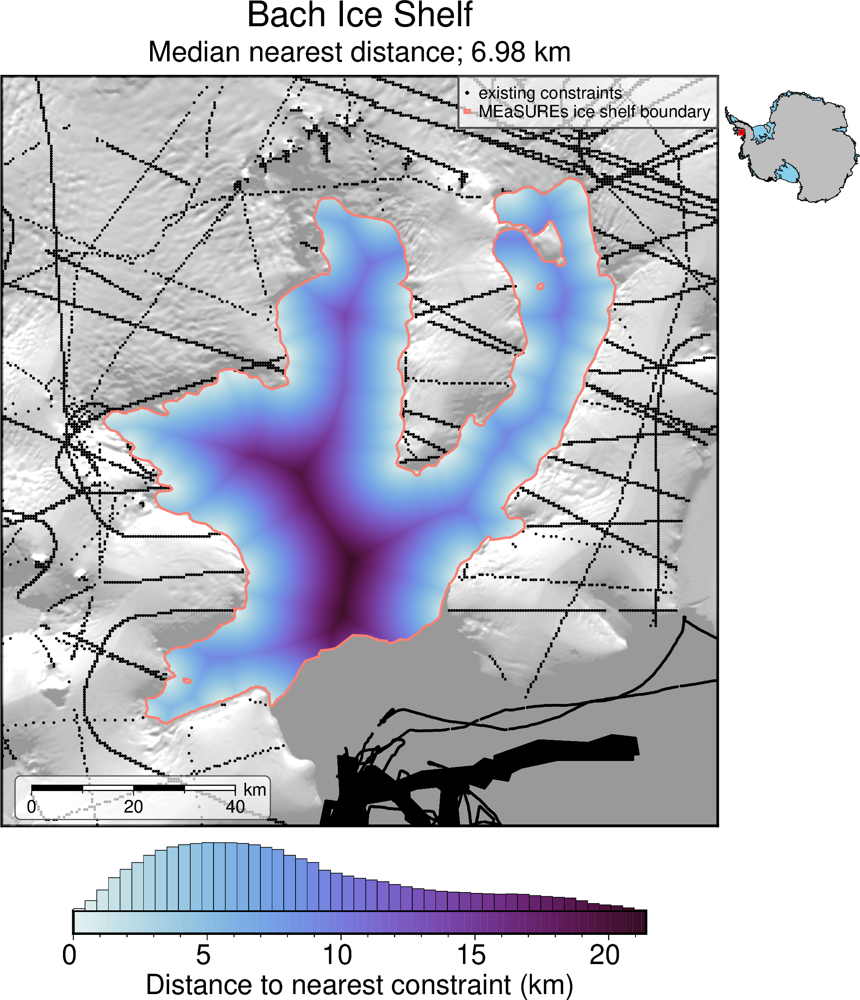

In [6]:
# choose an individual ice shelf by name
# shelf = ice_shelves[ice_shelves.NAME == "Ross"].iloc[0]

# choose an individual ice shelf size
shelf = ice_shelves.iloc[30]

ice_shelf_stats.constraints_and_min_distances_single(
    shelf,
    version="bedmachine",
    spacing=100,
    buffer=20e3,
    plot=True,
    # fname=f"../results/ice_shelves/{shelf.NAME}",
)

#### for a range of ice shelves
Will save point measurements to file `<shelf-name>_constraints.csv.gz` and grid of distance to nearest constraints to `<shelf-name>_min_dist.nc`.

In [ ]:
ice_shelf_stats.constraints_and_min_distances(
    ice_shelves,
    version="bedmachine",
    spacing=100,
    buffer=20e3,
    plot=False,
    save_plot=False,
    file_path="../results/ice_shelves/",
)

### Load the files, calculate stats, and plot
If `save_plot` is True it will save plots to `<file_path><shelf-name>_constraints.png`

In [ ]:
# for a range of ice shelves
# ice_shelf_stats.load_constraints_and_min_distances(
#     ice_shelves,
#     plot=False,
#     save_plot=True,
#     file_path="../results/ice_shelves/",
# )

## Gravity anomalies

### Calculate gravity anomalies and save to a csv
loads constraints from file so they must exist already (use the above functions)

#### for an individual shelf

  0%|          | 0/650 [00:00<?, ?it/s]

  0%|          | 0/650 [00:00<?, ?it/s]

  0%|          | 0/650 [00:00<?, ?it/s]

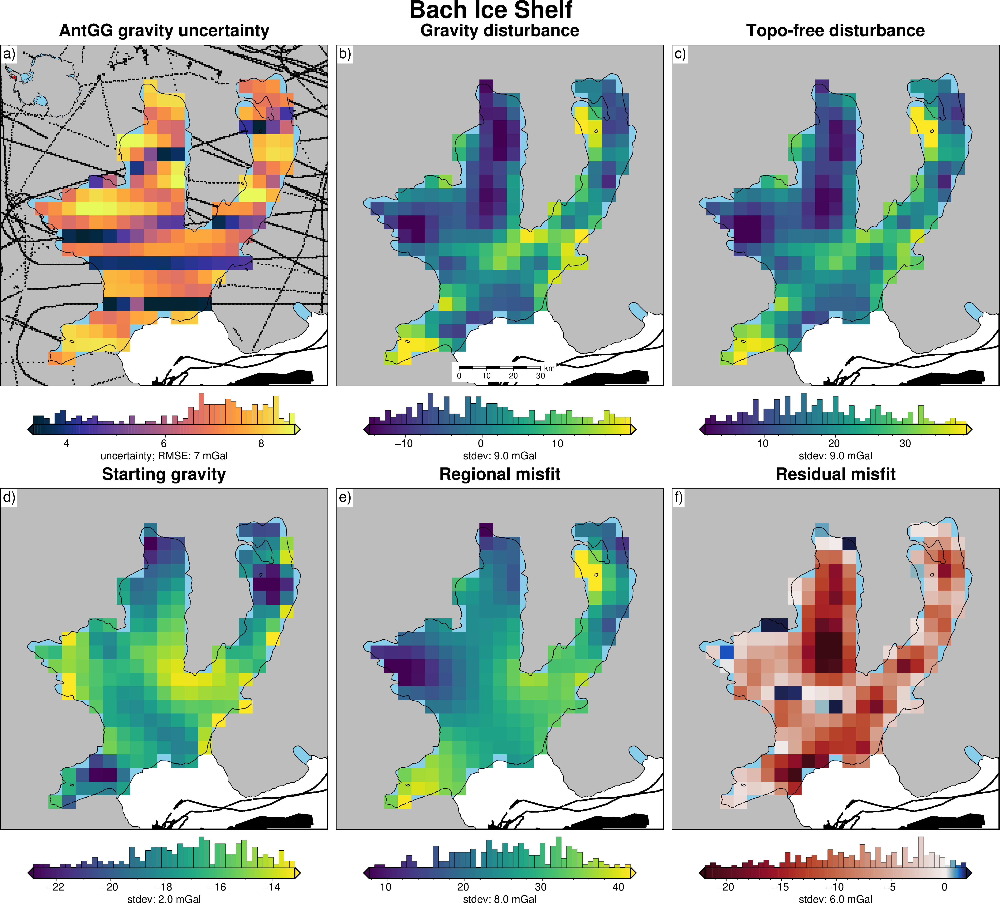

In [7]:
# choose an individual ice shelf by name
# shelf = ice_shelves[ice_shelves.NAME == "Ross"].iloc[0]

# choose an individual ice shelf size
shelf = ice_shelves.iloc[30]

ice_shelf_stats.gravity_anomalies_single(
    shelf,
    buffer=10e3,
    spacing = 5e3,
    constraints_df=pd.read_csv(f"../results/ice_shelves/{shelf.NAME}_constraints.csv.gz"),
    regional_grav_kwargs=dict(
        method="constraints",
        grid_method="pygmt",
        tension_factor=0,
    ),
    progressbar=True,
    plot=True,
    # fname=f"../results/ice_shelves/{shelf.NAME}",
)

#### for a range of ice shelves
Will save gravity anomalies to file `<shelf-name>_grav_anomalies.csv.gz`.

In [ ]:
ice_shelf_stats.gravity_anomalies(
    ice_shelves,
    buffer=10e3,
    spacing=5e3,  # AntGG is 5km, so no need to go finer
    regional_grav_kwargs=dict(
        method="constraints",
        grid_method="pygmt",
        tension_factor=0,  # was 2.5, but 0 adheres to the constraints better
    ),
    # progressbar=True,
    # plot=True, # THIS ADDS A LOT OF TIME!!
    # save_plot=True,
    file_path="../results/ice_shelves/",
)

### Load the files, calculate stats and plot

In [11]:
# # for a range of ice shelves
# ice_shelves_subset = ice_shelf_stats.load_grav_anomalies(
#     ice_shelves,
#     # plot=True,
#     # save_plot=True,
#     file_path="../results/ice_shelves/",
# )
# ice_shelves_subset

In [10]:
# ice_shelves_subset[ice_shelves_subset.isna().any(axis=1)]

## Load constraints, minimum distances, and gravity anomaly files

grdinfo [WARNING]: Guessing of registration in conflict between x and y, using gridline
/home/sungw937/synthetic_bathymetry_inversion/.pixi/envs/default/lib/python3.12/site-packages/pygmt/clib/session.py:667: RuntimeWarning:

The definition of geographic CRS EPSG:4326 got from GeoTIFF keys is not the same as the one from the EPSG registry, which may cause issues during reprojection operations. Set GTIFF_SRS_SOURCE configuration option to EPSG to use official parameters (overriding the ones from GeoTIFF keys), or to GEOKEYS to use custom values from GeoTIFF keys and drop the EPSG code.

grdinfo [WARNING]: Guessing of registration in conflict between x and y, using gridline
/home/sungw937/synthetic_bathymetry_inversion/.pixi/envs/default/lib/python3.12/site-packages/pygmt/clib/session.py:667: RuntimeWarning:

The definition of geographic CRS EPSG:4326 got from GeoTIFF keys is not the same as the one from the EPSG registry, which may cause issues during reprojection operations. Set GTIFF_

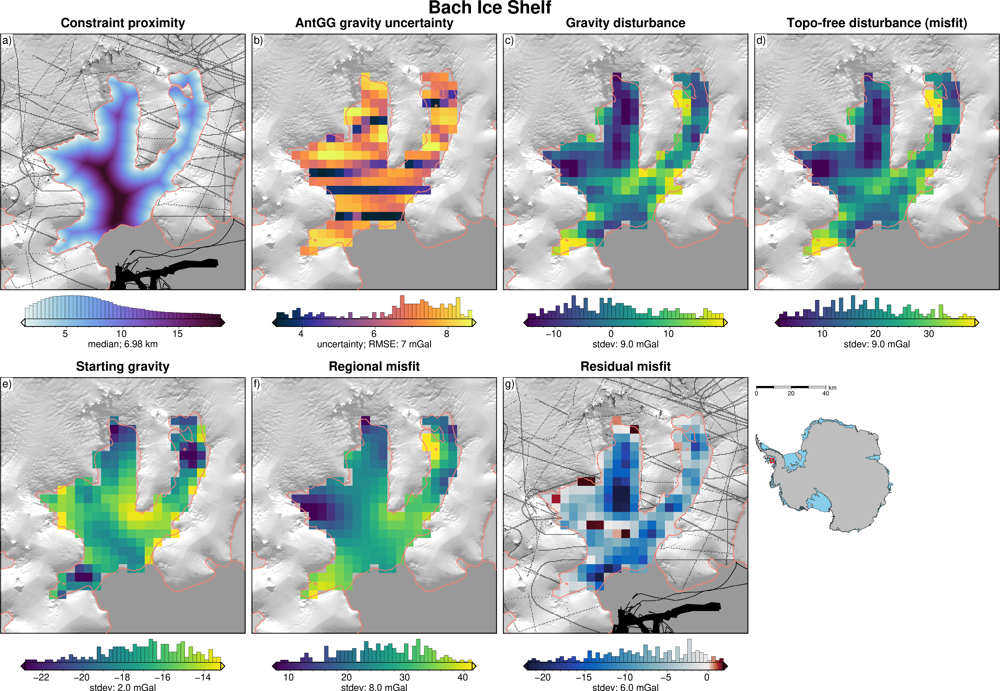

,NAME,Regions,TYPE,geometry,area_km,median_constraint_distance,mean_constraint_distance,max_constraint_distance,constraint_proximity_skewness,gravity_disturbance_rms,...,reg_rms,reg_stdev,res_rms,res_stdev,error_rms,error_stdev,residual_constraint_proximity_ratio_rms,residual_constraint_proximity_ratio_stdev,regional_constraint_proximity_ratio_rms,regional_constraint_proximity_ratio_stdev
30,Bach,Peninsula,FL,"POLYGON ((-1852808.829 579336.22, -1853187.96 ...",4547.92,6.984483,7.902379,21.396119,0.736829,9.435792,...,27.131616,7.860826,9.996486,6.068227,6.824091,1.558595,103.680658,74.729847,238.272021,124.704572


In [12]:
# choose an individual ice shelf by name
# shelf = ice_shelves[ice_shelves.NAME == "Ross"].iloc[0]

# choose an individual ice shelf size
shelf = ice_shelves.iloc[30]

shelf = ice_shelf_stats.load_ice_shelf_info_single(
    shelf,
    plot=True,
    # save_plot=False,
    file_path="../results/ice_shelves/",
)
shelf

In [16]:
# ice_shelves[ice_shelves.NAME=="Gillet"]

In [19]:
# for a range of ice shelves
ice_shelf_stats_gdf = ice_shelf_stats.load_ice_shelf_info(
    ice_shelves.iloc[:],
    # plot=True, # THIS ADDS A LOT OF TIME!!
    # save_plot=True,
    file_path="../results/ice_shelves/",
)
ice_shelf_stats_gdf

Ice Shelves:   0%|          | 0/164 [00:00<?, ?it/s]

grdinfo [WARNING]: Guessing of registration in conflict between x and y, using gridline
grdinfo [WARNING]: Guessing of registration in conflict between x and y, using gridline
grdinfo [WARNING]: Guessing of registration in conflict between x and y, using gridline
grdinfo [WARNING]: Guessing of registration in conflict between x and y, using gridline
grdinfo [WARNING]: Guessing of registration in conflict between x and y, using gridline
grdinfo [WARNING]: Guessing of registration in conflict between x and y, using gridline
grdinfo [WARNING]: Guessing of registration in conflict between x and y, using gridline
grdinfo [WARNING]: Guessing of registration in conflict between x and y, using gridline
grdinfo [WARNING]: Guessing of registration in conflict between x and y, using gridline
grdinfo [WARNING]: Guessing of registration in conflict between x and y, using gridline
grdinfo [WARNING]: Guessing of registration in conflict between x and y, using gridline
grdinfo [WARNING]: Guessing of r

,NAME,Regions,TYPE,geometry,area_km,median_constraint_distance,mean_constraint_distance,max_constraint_distance,constraint_proximity_skewness,gravity_disturbance_rms,...,reg_rms,reg_stdev,res_rms,res_stdev,error_rms,error_stdev,residual_constraint_proximity_ratio_rms,residual_constraint_proximity_ratio_stdev,regional_constraint_proximity_ratio_rms,regional_constraint_proximity_ratio_stdev
0,Ross,West,FL,"POLYGON ((-240677.184 -678259.006, -240038.274...",480428.37,17.282824,17.636882,62.339089,0.431810,44.934094,...,17.652465,17.159272,6.399599,6.397548,12.748633,3.154937,132.093296,132.083718,306.642616,292.262320
1,Ronne_Filchner,West,FL,"POLYGON ((-1006734.891 880592.98, -1006335.923...",427041.7,7.686515,8.739788,46.338298,1.456174,41.514238,...,34.036735,20.853880,4.087359,4.084574,7.952294,1.760702,60.063692,60.065236,350.615365,251.773078
2,Amery,East,FL,"POLYGON ((2134701.422 618463.117, 2131452.011 ...",60797.28,16.941666,21.373582,74.852666,0.844014,54.656450,...,41.754702,25.626999,15.490488,12.651456,8.432001,0.497149,516.984001,453.747317,1173.773769,858.199460
3,LarsenC,Peninsula,FL,"POLYGON ((-2235724.269 1271352.188, -2235828.5...",47443.51,9.067471,10.260593,36.855613,0.763313,14.824574,...,38.595139,14.498270,5.654761,5.647546,5.735885,1.390208,69.319708,69.157083,508.573512,329.301767
4,Riiser-Larsen,East,FL,"POLYGON ((-592166.317 1592824.258, -593783.16 ...",42913.14,17.664812,20.596557,63.202992,0.713248,53.556828,...,80.002938,41.235478,11.714963,11.313144,8.285409,0.728764,400.456039,396.959121,1942.610309,1289.222243
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
159,Perkins,West,FL,"POLYGON ((-1129608.753 -1201300.734, -1130034....",7.01,2.075342,2.112520,3.596783,0.276165,35.889366,...,29.411804,NaN,0.718530,NaN,9.619194,NaN,2.032311,NaN,83.189190,NaN
160,Paternostro,East,FL,"POLYGON ((824294.485 -2115301.607, 823916.673 ...",6.55,4.640709,4.706416,6.268170,0.309649,86.748530,...,64.892448,NaN,10.629006,NaN,15.171013,NaN,54.197508,NaN,330.887860,NaN
161,Arneb,East,FL,"POLYGON ((333867.825 -1897953.452, 333673.461 ...",6.41,0.472634,0.514199,1.489991,0.395076,87.524420,...,56.311577,NaN,2.759914,NaN,14.611639,NaN,2.386126,NaN,48.685036,NaN
162,Falkner,East,FL,"POLYGON ((425350.532 -1726631.609, 423726.753 ...",5.69,2.028684,2.044244,3.443504,0.326008,34.156963,...,31.781820,NaN,0.195284,NaN,13.661284,NaN,0.199464,NaN,32.462190,NaN


In [20]:
assert len(ice_shelves[~ice_shelves.NAME.isin(ice_shelf_stats_gdf.NAME.to_numpy())]) == 0, "Some ice shelves are missing from the stats gdf!"

### Clean up NaNs and outliers

In [21]:
# drop rows with any NaNs
to_drop = ice_shelf_stats_gdf[ice_shelf_stats_gdf.isna().any(axis=1)]
print(to_drop.NAME)

ice_shelf_stats_gdf = ice_shelf_stats_gdf.drop(to_drop.index).reset_index(drop=True)

ice_shelf_stats_gdf.describe()

121                Porter
124                Alison
126               Skallen
128              Garfield
129          Hummer_Point
130    Commandant_Charcot
131                 Suter
132               Gannutz
133            Harmon_Bay
134              Fox_East
136               Britten
138        Dawson_Lambton
139              Sandford
140                Barber
141              Fox_West
142                 Morse
143              Chugunov
144                 Telen
145                Erebus
146                 Hovde
147                McLeod
148                Kirkby
149               Liotard
150      Quatermain_Point
151             ClarkeBay
152               Manhaul
153        CapeWashington
154     Hayes_Coats_Coast
155                 Marin
156               Rydberg
157           Eltanin_Bay
158            Rose_Point
159               Perkins
160           Paternostro
161                 Arneb
162               Falkner
163     Hamilton_Piedmont
Name: NAME, dtype: object


,median_constraint_distance,mean_constraint_distance,max_constraint_distance,constraint_proximity_skewness,gravity_disturbance_rms,gravity_disturbance_stdev,partial_topo_free_disturbance_rms,partial_topo_free_disturbance_stdev,topo_free_disturbance_rms,topo_free_disturbance_stdev,...,reg_rms,reg_stdev,res_rms,res_stdev,error_rms,error_stdev,residual_constraint_proximity_ratio_rms,residual_constraint_proximity_ratio_stdev,regional_constraint_proximity_ratio_rms,regional_constraint_proximity_ratio_stdev
count,127.000000,127.000000,127.000000,127.000000,127.000000,127.000000,127.000000,127.000000,127.000000,127.000000,...,127.000000,127.000000,127.000000,127.000000,127.000000,127.000000,127.000000,127.000000,127.000000,127.000000
mean,7.124834,7.733093,20.343062,0.404379,55.395058,16.125496,54.545636,16.078407,42.805295,14.487415,...,39.961627,12.541627,9.820118,7.098303,8.493863,1.245829,120.064749,100.267585,332.893638,197.890667
std,5.314390,5.718142,16.434529,0.405489,34.679864,12.956594,34.106304,12.880558,28.893933,12.283060,...,27.527864,11.807217,7.111844,4.938830,2.968893,0.983219,147.908804,129.354572,335.737578,224.609870
min,1.102750,1.103613,2.569476,-0.658548,3.632344,0.197733,6.569456,0.843926,4.084871,0.580218,...,4.204181,0.103337,0.410609,0.188445,3.798641,0.002048,2.079268,1.845763,5.649626,0.848616
25%,3.714447,4.062338,9.438007,0.120974,28.286185,7.333049,27.930243,7.284582,20.847272,6.295085,...,19.550580,4.908899,4.156779,3.049535,6.479849,0.321911,23.821390,19.743218,123.473779,58.874112
50%,5.749979,6.168523,14.461560,0.408027,48.432745,13.582903,47.111583,13.281436,35.812502,11.178961,...,34.002267,8.680453,7.515214,5.918649,8.285409,1.167709,57.597920,43.879894,213.130653,125.566951
75%,8.093071,8.786355,26.429642,0.704091,78.808785,20.482688,77.445091,20.609175,57.571606,17.672857,...,53.699257,16.373263,14.293922,10.074061,9.634286,1.884681,157.613911,126.983756,406.895052,233.515759
max,32.468017,32.413522,84.476658,1.548030,201.018641,72.044363,198.915194,72.046149,169.674879,66.265034,...,155.550517,66.504162,36.698088,22.316325,15.204343,4.057948,878.761872,796.097579,1942.610309,1289.222243


In [22]:
stats_to_check = [
    "gravity_disturbance_stdev",
    "partial_topo_free_disturbance_stdev",
    "topo_free_disturbance_stdev",
    "starting_gravity_stdev",
    "reg_stdev",
    "res_stdev",
    # 'error_stdev',
    "median_constraint_distance",
    "max_constraint_distance",
    "constraint_proximity_skewness",
]

stats_df = ice_shelf_stats_gdf[stats_to_check].apply(sp.stats.zscore)

outliers = stats_df[(stats_df > 4).any(axis=1)]
cols = outliers.columns.tolist()
outliers = outliers.merge(
    ice_shelf_stats_gdf[["NAME"]], left_index=True, right_index=True, how="left"
)
outliers = outliers[["NAME", *cols]]
print(outliers.NAME.unique())
outliers

['Ekstrom' 'Conger_Glenzer']


,NAME,gravity_disturbance_stdev,partial_topo_free_disturbance_stdev,topo_free_disturbance_stdev,starting_gravity_stdev,reg_stdev,res_stdev,median_constraint_distance,max_constraint_distance,constraint_proximity_skewness
21,Ekstrom,4.332954,4.362342,4.232063,-0.034550,4.588401,-0.457230,-0.829582,-0.307839,1.701567
46,Conger_Glenzer,0.311252,0.320998,0.516343,-0.742625,-0.598667,2.052496,4.787671,1.797556,-0.982396


Ice Shelves:   0%|          | 0/2 [00:00<?, ?it/s]

grdinfo [WARNING]: Guessing of registration in conflict between x and y, using gridline
/home/sungw937/synthetic_bathymetry_inversion/.pixi/envs/default/lib/python3.12/site-packages/pygmt/clib/session.py:667: RuntimeWarning:

The definition of geographic CRS EPSG:4326 got from GeoTIFF keys is not the same as the one from the EPSG registry, which may cause issues during reprojection operations. Set GTIFF_SRS_SOURCE configuration option to EPSG to use official parameters (overriding the ones from GeoTIFF keys), or to GEOKEYS to use custom values from GeoTIFF keys and drop the EPSG code.

grdinfo [WARNING]: Guessing of registration in conflict between x and y, using gridline
/home/sungw937/synthetic_bathymetry_inversion/.pixi/envs/default/lib/python3.12/site-packages/pygmt/clib/session.py:667: RuntimeWarning:

The definition of geographic CRS EPSG:4326 got from GeoTIFF keys is not the same as the one from the EPSG registry, which may cause issues during reprojection operations. Set GTIFF_

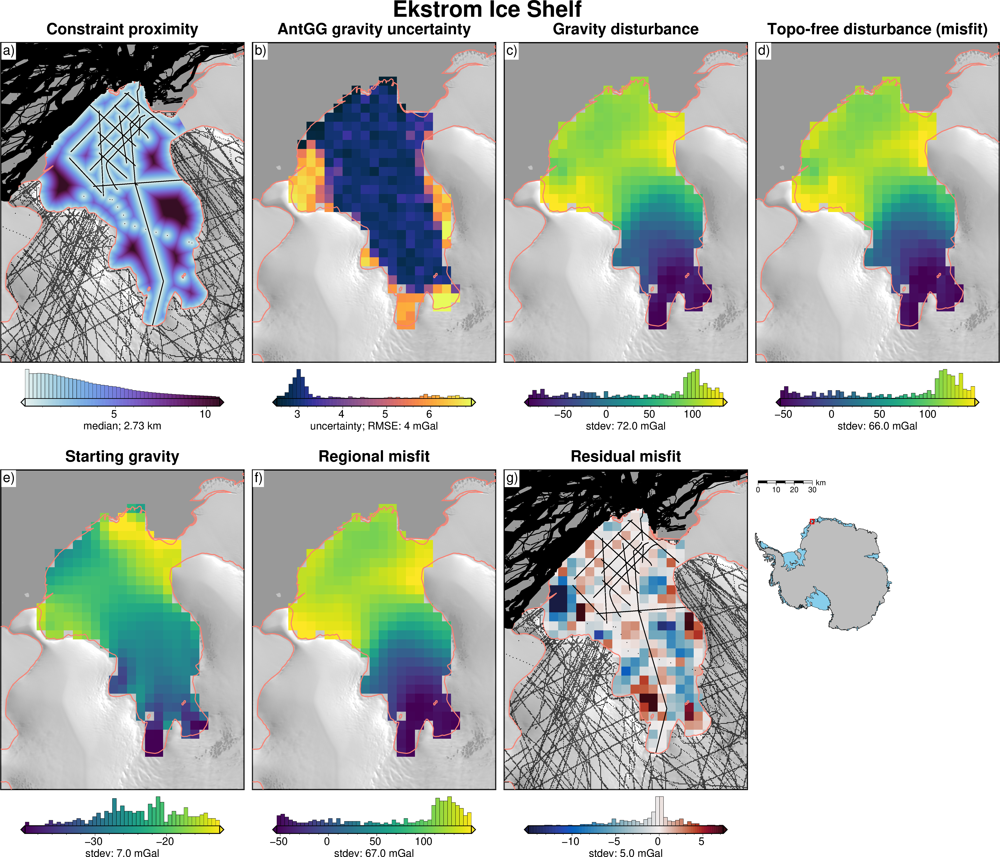

/home/sungw937/synthetic_bathymetry_inversion/.pixi/envs/default/lib/python3.12/site-packages/pygmt/clib/session.py:667: RuntimeWarning:

The definition of geographic CRS EPSG:4326 got from GeoTIFF keys is not the same as the one from the EPSG registry, which may cause issues during reprojection operations. Set GTIFF_SRS_SOURCE configuration option to EPSG to use official parameters (overriding the ones from GeoTIFF keys), or to GEOKEYS to use custom values from GeoTIFF keys and drop the EPSG code.

/home/sungw937/synthetic_bathymetry_inversion/.pixi/envs/default/lib/python3.12/site-packages/pygmt/clib/session.py:667: RuntimeWarning:

The definition of geographic CRS EPSG:4326 got from GeoTIFF keys is not the same as the one from the EPSG registry, which may cause issues during reprojection operations. Set GTIFF_SRS_SOURCE configuration option to EPSG to use official parameters (overriding the ones from GeoTIFF keys), or to GEOKEYS to use custom values from GeoTIFF keys and drop the EP

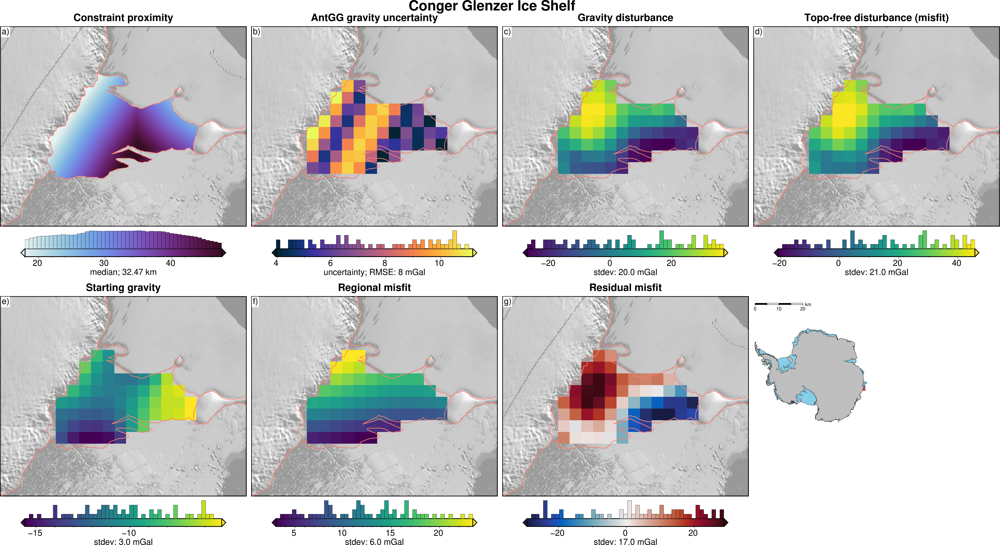

,NAME,Regions,TYPE,geometry,area_km,median_constraint_distance,mean_constraint_distance,max_constraint_distance,constraint_proximity_skewness,gravity_disturbance_rms,...,reg_rms,reg_stdev,res_rms,res_stdev,error_rms,error_stdev,residual_constraint_proximity_ratio_rms,residual_constraint_proximity_ratio_stdev,regional_constraint_proximity_ratio_rms,regional_constraint_proximity_ratio_stdev
21,Ekstrom,East,FL,"POLYGON ((-321325.354 2109824.907, -322025.425...",6870.83,2.733504,3.413805,15.303827,1.091623,88.423961,...,100.430952,66.504162,5.032808,4.849027,3.945405,1.349207,36.847508,35.538492,391.933600,322.561833
46,Conger_Glenzer,East,FL,"POLYGON ((2569966.039 -636188.979, 2570323.627...",1600.94,32.468017,32.413522,49.768507,0.007600,20.600937,...,13.571781,5.500923,17.290143,17.195246,7.846109,2.314243,567.785134,572.027791,413.540516,138.254030


In [23]:
outlier_stats = ice_shelf_stats.load_ice_shelf_info(
    ice_shelves[ice_shelves.NAME.isin(outliers.NAME.unique())],
    plot=True,
    file_path="../results/ice_shelves/",
)
outlier_stats

In [ ]:
# decide to drop these shelves?
# ice_shelf_stats_gdf = ice_shelf_stats_gdf.drop(outlier_stats.index).reset_index(drop=True)

In [24]:
ice_shelf_stats_gdf = ice_shelf_stats_gdf.sort_values(
    "area_km", ascending=False
).reset_index(drop=True)
ice_shelf_stats_gdf

,NAME,Regions,TYPE,geometry,area_km,median_constraint_distance,mean_constraint_distance,max_constraint_distance,constraint_proximity_skewness,gravity_disturbance_rms,...,reg_rms,reg_stdev,res_rms,res_stdev,error_rms,error_stdev,residual_constraint_proximity_ratio_rms,residual_constraint_proximity_ratio_stdev,regional_constraint_proximity_ratio_rms,regional_constraint_proximity_ratio_stdev
0,Ross,West,FL,"POLYGON ((-240677.184 -678259.006, -240038.274...",480428.37,17.282824,17.636882,62.339089,0.431810,44.934094,...,17.652465,17.159272,6.399599,6.397548,12.748633,3.154937,132.093296,132.083718,306.642616,292.262320
1,Ronne_Filchner,West,FL,"POLYGON ((-1006734.891 880592.98, -1006335.923...",427041.7,7.686515,8.739788,46.338298,1.456174,41.514238,...,34.036735,20.853880,4.087359,4.084574,7.952294,1.760702,60.063692,60.065236,350.615365,251.773078
2,Amery,East,FL,"POLYGON ((2134701.422 618463.117, 2131452.011 ...",60797.28,16.941666,21.373582,74.852666,0.844014,54.656450,...,41.754702,25.626999,15.490488,12.651456,8.432001,0.497149,516.984001,453.747317,1173.773769,858.199460
3,LarsenC,Peninsula,FL,"POLYGON ((-2235724.269 1271352.188, -2235828.5...",47443.51,9.067471,10.260593,36.855613,0.763313,14.824574,...,38.595139,14.498270,5.654761,5.647546,5.735885,1.390208,69.319708,69.157083,508.573512,329.301767
4,Riiser-Larsen,East,FL,"POLYGON ((-592166.317 1592824.258, -593783.16 ...",42913.14,17.664812,20.596557,63.202992,0.713248,53.556828,...,80.002938,41.235478,11.714963,11.313144,8.285409,0.728764,400.456039,396.959121,1942.610309,1289.222243
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122,Drury,East,FL,"POLYGON ((895410.318 -2105991.071, 895410.318 ...",55.61,3.143890,3.746163,9.463699,0.496175,85.931453,...,62.911283,0.391773,1.065483,0.188445,12.959736,0.030865,5.806477,2.009965,373.109779,180.049402
123,Zelee,East,FL,"POLYGON ((1595256.149 -1990608.354, 1594944.21...",40.65,2.835378,2.856841,6.070070,0.102221,56.605168,...,46.436621,16.304421,3.328922,2.252083,6.485042,1.849987,13.854037,12.595032,108.332900,58.853888
124,Dalk,East,FL,"POLYGON ((2199011.876 527659.283, 2197112.442 ...",35.44,1.102750,1.103613,2.569476,0.153243,9.456864,...,7.182482,2.665939,3.898634,3.898634,8.295042,0.233987,6.164256,6.164256,5.649626,5.331062
125,Marret,East,FL,"POLYGON ((1739518.675 -1925310.88, 1739760.363...",26.08,1.629186,1.762193,4.782843,0.875108,67.773671,...,34.602215,3.131162,2.255713,2.836850,14.314831,0.472625,4.863799,5.569957,63.426217,32.656915


### Save to csv

In [ ]:
ice_shelf_stats_gdf.to_csv(
    "../results/ice_shelves/ice_shelf_gravity_stats.csv",
    index=False,
)

In [ ]:
df_old = pd.read_csv(
    "../../synthetic_bathymetry_inversion_old2/results/ice_shelves/ice_shelf_gravity_stats.csv"
)
df_new = pd.read_csv(
    "../results/ice_shelves/ice_shelf_gravity_stats.csv"
)
pd.testing.assert_frame_equal(
    df_old,
    df_new,
    rtol=1
)

,NAME,Regions,TYPE,geometry,area_km,median_constraint_distance,mean_constraint_distance,max_constraint_distance,constraint_proximity_skewness,gravity_disturbance_rms,...,reg_rms,reg_stdev,res_rms,res_stdev,error_rms,error_stdev,residual_constraint_proximity_ratio_rms,residual_constraint_proximity_ratio_stdev,regional_constraint_proximity_ratio_rms,regional_constraint_proximity_ratio_stdev
0,Ross,West,FL,POLYGON ((-240677.18377991652 -678259.00593521...,480428.37,17.282824,17.636882,62.339089,0.431810,44.934094,...,17.652465,17.159272,6.399599,6.397548,12.748633,3.154937,132.093296,132.083718,306.642616,292.262320
1,Ronne_Filchner,West,FL,POLYGON ((-1006734.8906412432 880592.979674786...,427041.70,7.686515,8.739788,46.338298,1.456174,41.514238,...,34.036735,20.853880,4.087359,4.084574,7.952294,1.760702,60.063692,60.065236,350.615365,251.773078
2,Amery,East,FL,POLYGON ((2134701.4219642165 618463.1172190169...,60797.28,16.941666,21.373582,74.852666,0.844014,54.656450,...,41.754702,25.626999,15.490488,12.651456,8.432001,0.497149,516.984001,453.747317,1173.773769,858.199460
3,LarsenC,Peninsula,FL,POLYGON ((-2235724.269360441 1271352.187501361...,47443.51,9.067471,10.260593,36.855613,0.763313,14.824574,...,38.595139,14.498270,5.654761,5.647546,5.735885,1.390208,69.319708,69.157083,508.573512,329.301767
4,Riiser-Larsen,East,FL,POLYGON ((-592166.3173854565 1592824.257663729...,42913.14,17.664812,20.596557,63.202992,0.713248,53.556828,...,80.002938,41.235478,11.714963,11.313144,8.285409,0.728764,400.456039,396.959121,1942.610309,1289.222243
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122,Drury,East,FL,"POLYGON ((895410.318218497 -2105991.070752478,...",55.61,3.143890,3.746163,9.463699,0.496175,85.931453,...,62.911283,0.391773,1.065483,0.188445,12.959736,0.030865,5.806477,2.009965,373.109779,180.049402
123,Zelee,East,FL,POLYGON ((1595256.149328336 -1990608.354406229...,40.65,2.835378,2.856841,6.070070,0.102221,56.605168,...,46.436621,16.304421,3.328922,2.252083,6.485042,1.849987,13.854037,12.595032,108.332900,58.853888
124,Dalk,East,FL,POLYGON ((2199011.8758713417 527659.2832139434...,35.44,1.102750,1.103613,2.569476,0.153243,9.456864,...,7.182482,2.665939,3.898634,3.898634,8.295042,0.233987,6.164256,6.164256,5.649626,5.331062
125,Marret,East,FL,POLYGON ((1739518.675443965 -1925310.880398920...,26.08,1.629186,1.762193,4.782843,0.875108,67.773671,...,34.602215,3.131162,2.255713,2.836850,14.314831,0.472625,4.863799,5.569957,63.426217,32.656915


### Combine results from each shelf for plotting

In [47]:
dfs = []
for i, row in ice_shelves.iterrows():
    try:
        df = pd.read_csv(
            f"../results/ice_shelves/{row.NAME}_constraints.csv.gz",
            sep=",",
            header=0,
            index_col=None,
            encoding="utf-8",
            compression="gzip",
            low_memory=False,
        )
        dfs.append(df)
    except FileNotFoundError:
        print(f"File not found for {row.NAME}")
antarctic_bed_points = pd.concat(dfs)
antarctic_bed_points.describe()

,easting,northing,dataid
count,2.793554e+07,2.793554e+07,1.068668e+06
mean,-5.809819e+05,1.277530e+04,2.527975e+00
std,9.537319e+05,1.445148e+06,2.309947e+00
min,-2.441000e+06,-2.158800e+06,1.000000e+00
25%,-1.442500e+06,-1.311378e+06,2.000000e+00
50%,-5.676500e+05,-4.447214e+05,2.000000e+00
75%,5.433132e+04,1.552491e+06,2.000000e+00
max,2.765432e+06,2.261490e+06,1.000000e+01


In [48]:
# save to files
antarctic_bed_points.to_csv(
    "../results/ice_shelves/antarctica_constraints.csv.gz",
    sep=",",
    na_rep="",
    header=True,
    index=False,
    encoding="utf-8",
    compression="gzip",
)

In [49]:
# Convert to GeoDataFrame
antarctic_bed_points_gdf = gpd.GeoDataFrame(
        antarctic_bed_points,
    geometry=gpd.points_from_xy(antarctic_bed_points.easting, antarctic_bed_points.northing),
    crs="EPSG:3031",
)

In [50]:
# Save to parquet which allows reading only rows within a geographic region (bbox)
antarctic_bed_points_gdf.to_parquet(
    "../results/ice_shelves/antarctica_constraints.parquet",
    write_covering_bbox=True,
    schema_version="1.1.0",
)

In [5]:
# antarctic_bed_points = gpd.read_parquet(
#     "../results/ice_shelves/antarctica_constraints.parquet",
# )

antarctic_bed_points = pd.read_csv(
    "../results/ice_shelves/antarctica_constraints.csv.gz",
    sep=",",
    header=0,
    index_col=None,
    encoding="utf-8",
    compression="gzip",
    low_memory=False,
)
antarctic_bed_points

,dataset_name,easting,northing,onshore,dataid,source
0,RS8102.xyz,4.145011e+05,-1.374758e+06,False,NaN,NaN
1,RS8102.xyz,4.152900e+05,-1.373359e+06,False,NaN,NaN
2,NBP96_1.xyz,4.143235e+05,-1.368955e+06,False,NaN,NaN
3,NBP96_1.xyz,4.144052e+05,-1.368934e+06,False,NaN,NaN
4,NBP96_1.xyz,4.144725e+05,-1.368895e+06,False,NaN,NaN
...,...,...,...,...,...,...
27935539,NaN,-1.603000e+06,-6.040000e+05,True,2.0,radar
27935540,NaN,-1.602500e+06,-6.040000e+05,True,2.0,radar
27935541,NaN,-1.602500e+06,-6.045000e+05,True,2.0,radar
27935542,NaN,-1.602000e+06,-6.045000e+05,True,2.0,radar


In [6]:
coords = vd.grid_coordinates(
    region=regions.antarctica,
    spacing=500,
)
grid = vd.make_xarray_grid(coords, np.ones_like(coords[0]), data_names="z").z

min_dist = utils.dist_nearest_points(
    antarctic_bed_points,
    data=grid,
).min_dist

min_dist = min_dist / 1e3

In [7]:
# mask to ice shelf regions
min_dist = polar_utils.mask_from_shp(
    shapefile=ice_shelves,
    grid=min_dist,
    invert=False,
    masked=True,
)
min_dist.to_netcdf("../results/ice_shelves/antarctica_min_dist.nc")

In [8]:
# define region around antarctica with a buffer
reg = polar_utils.region_to_bounding_box(
    gpd.read_file(fetch.antarctic_boundaries(version="Coastline")).bounds.to_numpy()[0]
)
reg = vd.pad_region(reg, 50e3)


dfs = []
for i, row in ice_shelves.iterrows():
    try:
        dfs.append(
            pd.read_csv(f"../results/ice_shelves/{row.NAME}_grav_anomalies.csv.gz")
        )
    except FileNotFoundError:
        print(f"File not found for {row.NAME}")

grav_df = pd.concat(dfs)

grav_grids = []
for col in ["gravity_disturbance", "topo_free_disturbance", "reg", "res", "error"]:
    grd = pygmt.xyz2grd(
        x=grav_df.easting,
        y=grav_df.northing,
        z=grav_df[col],
        region=reg,
        spacing=5e3,
    ).rename(col)

    # mask to ice shelf regions
    grd = polar_utils.mask_from_shp(
        shapefile=ice_shelves,
        grid=grd,
        invert=False,
        masked=True,
    )
    grav_grids.append(grd)

grav_grid = xr.merge(grav_grids)
grav_grid

xyz2grd [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
xyz2grd [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
xyz2grd (gmtapi_init_grdheader): Please select compatible -R and -I values
xyz2grd [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
xyz2grd [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
xyz2grd (gmtapi_init_grdheader): Please select compatible -R and -I values
xyz2grd [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
xyz2grd [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
xyz2grd (gmtapi_init_grdheader): Please select compatible -R and -I values
xyz2grd [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
xyz2grd [WAR

<xarray.Dataset> Size: 19MB
Dimensions:                (y: 898, x: 1072)
Coordinates:
  * y                      (y) float64 7kB -2.194e+06 -2.189e+06 ... 2.291e+06
  * x                      (x) float64 9kB -2.558e+06 -2.553e+06 ... 2.795e+06
Data variables:
    gravity_disturbance    (y, x) float32 4MB nan nan nan nan ... nan nan nan
    topo_free_disturbance  (y, x) float32 4MB nan nan nan nan ... nan nan nan
    reg                    (y, x) float32 4MB nan nan nan nan ... nan nan nan
    res                    (y, x) float32 4MB nan nan nan nan ... nan nan nan
    error                  (y, x) float32 4MB nan nan nan nan ... nan nan nan
Attributes:
    Conventions:   CF-1.7
    title:         
    history:       gmt xyz2grd @GMTAPI@-S-I-D-V-T-N-000000 -G@GMTAPI@-S-O-G-G...
    description:   
    actual_range:  [nan nan]
    long_name:     z

In [9]:
grav_grid.to_netcdf("../results/ice_shelves/antarctica_grav_grids.nc")

### Add constraint to shelves

In [5]:
df = pd.read_csv("../results/ice_shelves/ice_shelf_gravity_stats.csv", index_col=None)

# turn back into geodataframe
ice_shelf_stats_gdf_full = gpd.GeoDataFrame(
    df,
    geometry=gpd.GeoSeries.from_wkt(df["geometry"], crs="EPSG:3031"),
    crs="EPSG:3031",
)
ice_shelf_stats_gdf = ice_shelf_stats_gdf_full[ice_shelf_stats_gdf_full.area_km > 1000]

In [3]:
# for a range of ice shelves
ice_shelf_added_constraints = ice_shelf_stats.add_single_constraint(
    ice_shelf_stats_gdf,
    file_path="../results/ice_shelves/",
    spacing=100,
    buffer=20e3,
)
ice_shelf_added_constraints

Ice Shelves:   0%|          | 0/50 [00:00<?, ?it/s]

,NAME,Regions,TYPE,geometry,area_km,median_constraint_distance,mean_constraint_distance,max_constraint_distance,constraint_proximity_skewness,gravity_disturbance_rms,...,res_stdev,error_rms,error_stdev,residual_constraint_proximity_ratio_rms,residual_constraint_proximity_ratio_stdev,regional_constraint_proximity_ratio_rms,regional_constraint_proximity_ratio_stdev,updated_median_constraint_distance,median_proximity_change,percent_median_proximity_change
0,Ross,West,FL,"POLYGON ((-240677.184 -678259.006, -240038.274...",480428.37,17.282824,17.636882,62.339089,0.431810,44.934094,...,6.397548,12.748633,3.154937,132.093296,132.083718,306.642616,292.262320,17.232338,0.050486,0.292117
1,Ronne_Filchner,West,FL,"POLYGON ((-1006734.891 880592.98, -1006335.923...",427041.70,7.686515,8.739788,46.338298,1.456174,41.514238,...,4.084574,7.952294,1.760702,60.063692,60.065236,350.615365,251.773078,7.680386,0.006128,0.079730
2,Amery,East,FL,"POLYGON ((2134701.422 618463.117, 2131452.011 ...",60797.28,16.941666,21.373582,74.852666,0.844014,54.656450,...,12.651456,8.432001,0.497149,516.984001,453.747317,1173.773769,858.199460,16.374142,0.567524,3.349870
3,LarsenC,Peninsula,FL,"POLYGON ((-2235724.269 1271352.188, -2235828.5...",47443.51,9.067471,10.260593,36.855613,0.763313,14.824574,...,5.647546,5.735885,1.390208,69.319708,69.157083,508.573512,329.301767,8.970575,0.096897,1.068617
4,Riiser-Larsen,East,FL,"POLYGON ((-592166.317 1592824.258, -593783.16 ...",42913.14,17.664812,20.596557,63.202992,0.713248,53.556828,...,11.313144,8.285409,0.728764,400.456039,396.959121,1942.610309,1289.222243,16.920875,0.743937,4.211407
5,Fimbul,East,FL,"POLYGON ((145423.961 2176737.792, 145088.314 2...",40947.75,5.450097,6.460643,26.199066,1.391103,55.666475,...,7.978892,6.037483,1.283386,104.190480,100.468045,651.273997,428.275246,5.432545,0.017552,0.322051
6,Brunt_Stancomb,East,FL,"POLYGON ((-648673.952 1612385.898, -648144.2 1...",36137.10,14.462157,18.965093,66.878832,0.713434,31.663309,...,14.232125,5.764394,2.020729,464.852285,411.069585,1195.526791,842.794187,13.506528,0.955630,6.607795
7,Getz,West,FL,"MULTIPOLYGON (((-1464395.442 -1011065.611, -14...",33389.04,10.337270,11.505782,40.419329,0.774685,45.815742,...,11.747717,6.840661,2.799637,290.474365,226.021130,142.812858,112.543489,10.146531,0.190739,1.845161
8,Baudouin,East,FL,"POLYGON ((894980.201 1963931.58, 894465.744 19...",33129.24,22.523870,24.018180,72.093600,0.635214,37.878304,...,8.132793,7.175396,1.815555,370.587351,313.933210,1189.930499,915.632328,20.907322,1.616548,7.177044
9,Abbot,West,FL,"MULTIPOLYGON (((-1946681.999 -330470.661, -194...",31389.73,9.786923,10.943510,34.300815,0.673908,28.653549,...,17.545262,6.650965,1.750310,362.377493,286.900839,341.590904,239.269065,9.617116,0.169807,1.735043


In [4]:
ice_shelf_added_constraints.to_csv(
    "../results/ice_shelves/ice_shelf_gravity_stats_added_constraint.csv",
    index=False,
)